## This notebook will actually construct the MSM from non TICA data

In [1]:
#imports
%pylab inline
import pyemma
import pyemma.coordinates as coor
import pyemma.msm as msm
import pyemma.plots as mplt
import seaborn as sbn
import glob
import itertools
import os
sbn.set_style("white")
sbn.set_style("ticks", {"xtick.major.size": 8, "ytick.major.size": 8})
sbn.set_context("paper", font_scale=2)
rc={"lines.linewidth": 2}

Populating the interactive namespace from numpy and matplotlib


## helper functions

In [2]:
def get_coarse_state(x,y,pcca_sets):
    x1 = 0
    y1 = 0
    for i in range(len(pcca_sets)):
        if x in pcca_sets[i]:
            x1 = i
        if y in pcca_sets[i]:
            y1 = i
    return x1, y1
    

In [3]:
def get_chi_per_state_list(dtraj, data, state, descriptor):
    '''
    Parameters
    ----------
    dtraj : list
        list of list containing discrete state trajectories
    data : 2-D array
        array containing input data dihedrals
    state : int
        integer of state we are interested in
    descriptor : int
        integer of the column containing particular dihedral of interest
    Returns
    -------
    chi_list : list
        merged list of dihedrals for a given microstate
    '''
    all_state_frames = []
    for d in dtraj:
        all_state_frames.append(np.where(d==state)[0])
    chi_1 = []
    for i in range(len(all_state_frames)):
        if len(all_state_frames[i])> 0:
            chi_1.append(np.degrees(data[i][all_state_frames[i]][:,descriptor]))
    merged = list(itertools.chain.from_iterable(chi_1))
    return merged

/home/pattama/Software/install/anaconda/lib/python2.7/site-packages/pyemma/__init__.py:130: UserWarning: You are not using the latest release of PyEMMA. Latest is 2.5.2, you have 2.5.1.
  .format(latest=latest, current=current), category=UserWarning)
/home/pattama/Software/install/anaconda/lib/python2.7/site-packages/pyemma/__init__.py:134: UserWarning: Python 2.7 usage is deprecated. Future versions of PyEMMA will not support it. Please upgrade your Python installation.
  "Please upgrade your Python installation.", category=UserWarning)


In [4]:
def get_per_state_dihedrals(dtrajs, data, column, num_centers=200):
    per_state_dih = []
    for i in range(num_centers):
        per_state_dih.append(get_chi_per_state_list(dtrajs, data, i, column))
    return per_state_dih

In [5]:
def hist_state_plot(chi, cluster):
    y,binEdges=np.histogram(chi[cluster],bins=20, normed=True)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    return bincenters,y

In [6]:
def coarse_grained_states(state_list, chi_list):
    '''
    Parameters
    ----------
    state_list : list
        corase grained indices list
    chi_list : list of lists
        per cluster list of dihedrals
    Returns
    -------
    chi_list : list
        merged list for all chis of the coarse grained states
    '''
    new_list = []
    for s in state_list:
        new_list.append(chi_list[s])
    merged = list(itertools.chain.from_iterable(new_list))
    return merged

In [7]:
def hist_coarse_grained(chi):
    y,binEdges=np.histogram(chi,bins=20, normed=True, range=[-180,180])
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    p_minus_60 = np.sum(y[0:10])
    p_plus_60 = np.sum(y[10:-1])
    return bincenters,y,p_minus_60,p_plus_60

In [8]:
def mfpt(M, set1, set2):
    samples = M.sample_f('mfpt', set1, set2)
    mean = np.mean(samples)
    std = np.std(samples)
    return mean,std

In [9]:
def get_dihdedral_histogram_with_weights(dihedral_traj, traj_weights, dih_idx):
    dih = []
    weight = []
    for i in range(len(dihedral_traj)):
        for j in range(len(dihedral_traj[i])):
            dih.append(dihedral_traj[i][j,dih_idx])
            weight.append(traj_weights[i][j])
    y, binEdges = np.histogram(dih,bins=100, weights=weight)
    bincenters = 0.5*(binEdges[1:]+binEdges[:-1])
    return y, bincenters

### Read discrete trajectories

In [10]:
data_WT = []
for i in range(20):
    data_WT.append(np.loadtxt('cluster/TICA_2/disctraj_WT_'+str(i)+'.dat', dtype='int32'))
data_S99T = []
for i in range(20):
    data_S99T.append(np.loadtxt('cluster/TICA_2/disctraj_S99T_'+str(i)+'.dat', dtype='int32'))
data_S99TCS = []
for i in range(20):
    data_S99TCS.append(np.loadtxt('cluster/TICA_2/disctraj_S99TCS_'+str(i)+'.dat', dtype='int32'))
data_S99TCSIV = []
for i in range(20):
    data_S99TCSIV.append(np.loadtxt('cluster/TICA_2/disctraj_S99TCSIV_'+str(i)+'.dat', dtype='int32'))

### Read dihedral trajectories

In [11]:
dihedral_WT = []
for i in range(10):
    dihedral_WT.append(np.loadtxt('dihedral_trajectories_WT_S99T/dihedral_WT_traj'+str(i)+'.dat'))
for i in range(10):
    dihedral_WT.append(np.loadtxt('dihedral_trajectories_WT_S99T_set2/dihedral_WT_traj'+str(i)+'.dat'))

In [12]:
dihedral_S99T = []
for i in range(10):
    dihedral_S99T.append(np.loadtxt('dihedral_trajectories_WT_S99T/dihedral_S99T_traj'+str(i)+'.dat'))
for i in range(10):
    dihedral_S99T.append(np.loadtxt('dihedral_trajectories_WT_S99T_set2/dihedral_S99T_traj'+str(i)+'.dat'))

In [13]:
dihedral_S99TCS = []
for i in range(10):
    dihedral_S99TCS.append(np.loadtxt('dihedral_trajectories_Xray_CSIV/dihedral_S99TCS_traj'+str(i)+'.dat'))
#add S99TCS mutation traj
for i in range(10):
    dihedral_S99TCS.append(np.loadtxt('dihedral_trajectories_mut_CSIV/dihedral_S99TCS_traj'+str(i)+'.dat'))

In [14]:
dihedral_S99TCSIV = []
for i in range(10):
    dihedral_S99TCSIV.append(np.loadtxt('dihedral_trajectories_Xray_CSIV/dihedral_S99TCSIV_traj'+str(i)+'.dat'))
#add S99TCSIV mutation traj
for i in range(10):
    dihedral_S99TCSIV.appenddihedral_trajectories_mut_CSIV/dihedral_S99TCSIV_traj'+str(i)+'.dat'))

## Estimating MSM

In [162]:
M_WT = msm.bayesian_markov_model(data_WT, 300, dt_traj='2 ps')
M_S99T = msm.bayesian_markov_model(data_S99T, 300, dt_traj='2 ps')
M_S99TCS =  msm.bayesian_markov_model(data_S99TCS, 300, dt_traj='2 ps')
M_S99TCSIV =  msm.bayesian_markov_model(data_S99TCSIV, 300, dt_traj='2 ps')

HBox(children=(HBox(children=(Label(value=u'Sampling MSMs'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

HBox(children=(HBox(children=(Label(value=u'Sampling MSMs'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

HBox(children=(HBox(children=(Label(value=u'Sampling MSMs'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

HBox(children=(HBox(children=(Label(value=u'Sampling MSMs'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

## Stationary properties

In [163]:
wt_weight = M_WT.trajectory_weights()
s99t_weight = M_S99T.trajectory_weights()
s99tcs_weight = M_S99TCS.trajectory_weights()
s99tcsiv_weight = M_S99TCSIV.trajectory_weights()

In [164]:
# Write out trajectory weights as trajectories
for i in range(len(wt_weight)):
    np.savetxt('weight_traj/weight_traj_wt_'+str(i), wt_weight[i])
    np.savetxt('weight_traj/weight_traj_s99t_'+str(i), s99t_weight[i])
    np.savetxt('weight_traj/weight_traj_s99tcs_'+str(i), s99tcs_weight[i])
    np.savetxt('weight_traj/weight_traj_s99tcsiv_'+str(i), s99tcsiv_weight[i])

## Implied timescale

In [18]:
its_wt = msm.timescales_msm(data_WT, lags=1000, nits=15, errors='bayes')

HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=16), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

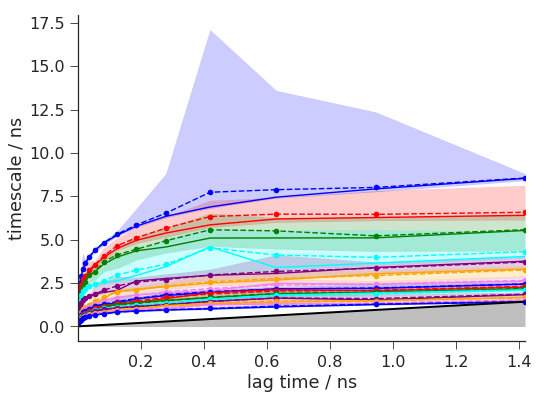

In [19]:
fig =figure(figsize(8,6))
mplt.plot_implied_timescales(its_wt, ylog=False, units='ns', dt=0.002)
sbn.despine()

In [20]:
its_s99t = msm.timescales_msm(data_S99T, lags=1000, nits=15, errors='bayes')

HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=16), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

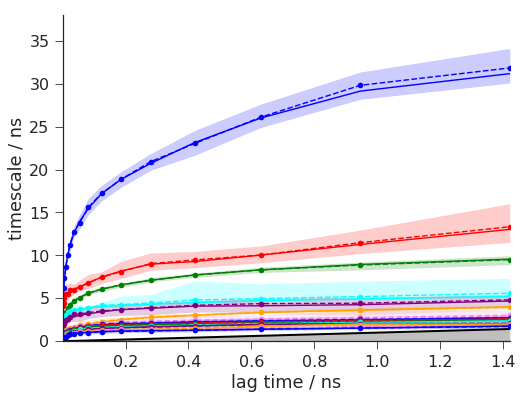

In [21]:
fig =figure(figsize(8,6))
mplt.plot_implied_timescales(its_s99t, ylog=False, units='ns', dt=0.002)
ylim(0,38)
sbn.despine()

In [22]:
its_s99tcs = msm.timescales_msm(data_S99TCS, lags=1000, nits=15, errors='bayes')

HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=16), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

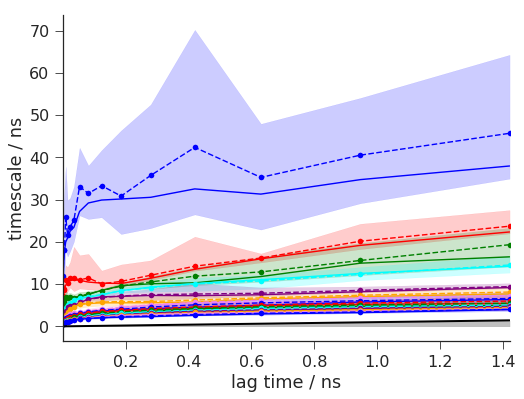

In [23]:
fig =figure(figsize(8,6))
mplt.plot_implied_timescales(its_s99tcs, ylog=False, units='ns', dt=0.002)
sbn.despine()

In [24]:
its_s99tcsiv = msm.timescales_msm(data_S99TCSIV, lags=1000, nits=15, errors='bayes')

HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=16), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

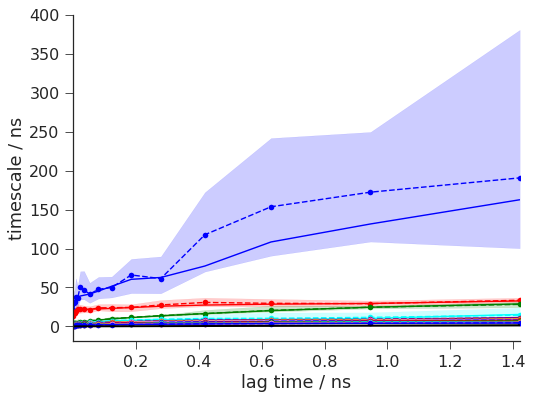

In [25]:
fig =figure(figsize(8,6))
mplt.plot_implied_timescales(its_s99tcsiv, ylog=False, units='ns', dt=0.002)
sbn.despine()

## WT Coarse graining manual

In [165]:
# dihe= chi1F113, chi1R55, chi1M61, chi1S99, chi13R55, chi2M61, chi1Cys115, chi1Ile97, chi1L98, chi1Q63, chi2L98, chi2Q63
per_state_chi1F113_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 0)
per_state_chi1R55_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 1)
per_state_chi1M61_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 2)
per_state_chi1S99_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 3)
per_state_chi3R55_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 4)
per_state_chi2M61_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 5)
per_state_chi1C115_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 6)
per_state_chi1I97_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 7)
per_state_chi1L98_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 8)
per_state_chi1Q63_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 9)
per_state_chi2L98_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 10)
per_state_chi2Q63_wt = get_per_state_dihedrals(data_WT, dihedral_WT, 11)



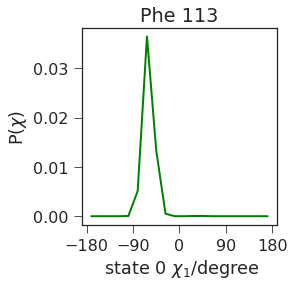

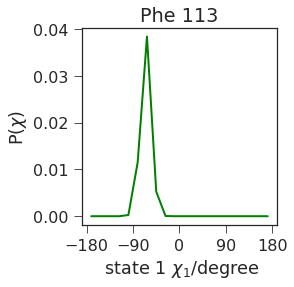

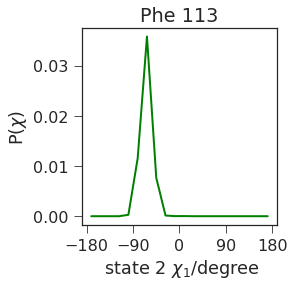

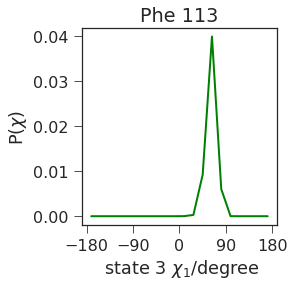

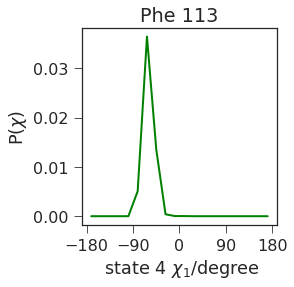

...

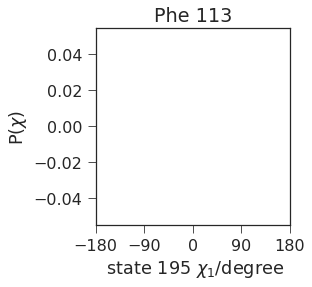

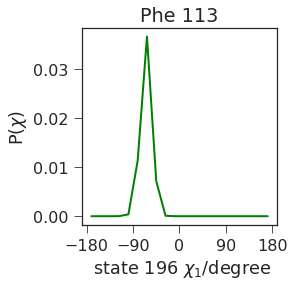

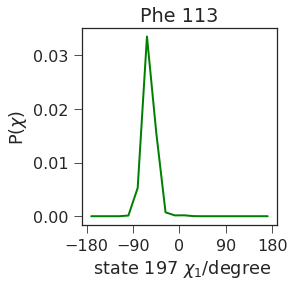

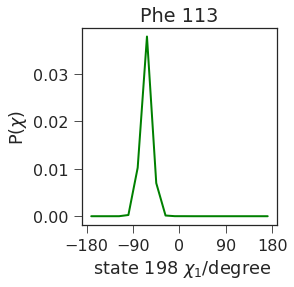

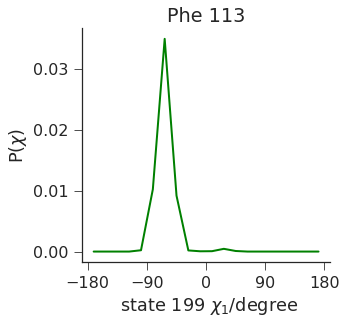

In [166]:
p1_list =[]
p2_list = []
for x in range(200):
    state = [x]
    TOT = coarse_grained_states(state,per_state_chi1F113_wt)
    b,y,p1,p2 = hist_coarse_grained(TOT)
    p1_list.append(p1)
    p2_list.append(p2)
    fig = plt.figure(figsize=(16,8))  
    ax = fig.add_subplot(2, 4, 1)
    ax.plot(b,y, '-', color='green', lw=2)
    ax.set_xticks([-180,-90,0,90,180])
    ax.set_xlabel(r' state %s $\chi_1$/degree'% x)
    ax.set_title('Phe 113')
    ax.set_ylabel(r'P($\chi$)')

plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


In [167]:
manual_membership = []
for i in range(len(p1_list)):
    if not math.isnan(p1_list[i]):
        norm = p1_list[i]+p2_list[i]
        mem = np.array([p1_list[i]/norm, p2_list[i]/norm])
        manual_membership.append(mem)
manual_membership = np.array(manual_membership)

In [168]:
#run ck test with manual memberships
ck_wt = M_WT.cktest(2, memberships=manual_membership,mlags=[1,2,4,6,8,10,14,18,25,50])


HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=10), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

(<matplotlib.figure.Figure at 0x7f2bbd2da2d0>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f2bda31d950>,
         <matplotlib.axes._subplots.AxesSubplot object at 0x7f2bba58e490>]], dtype=object))

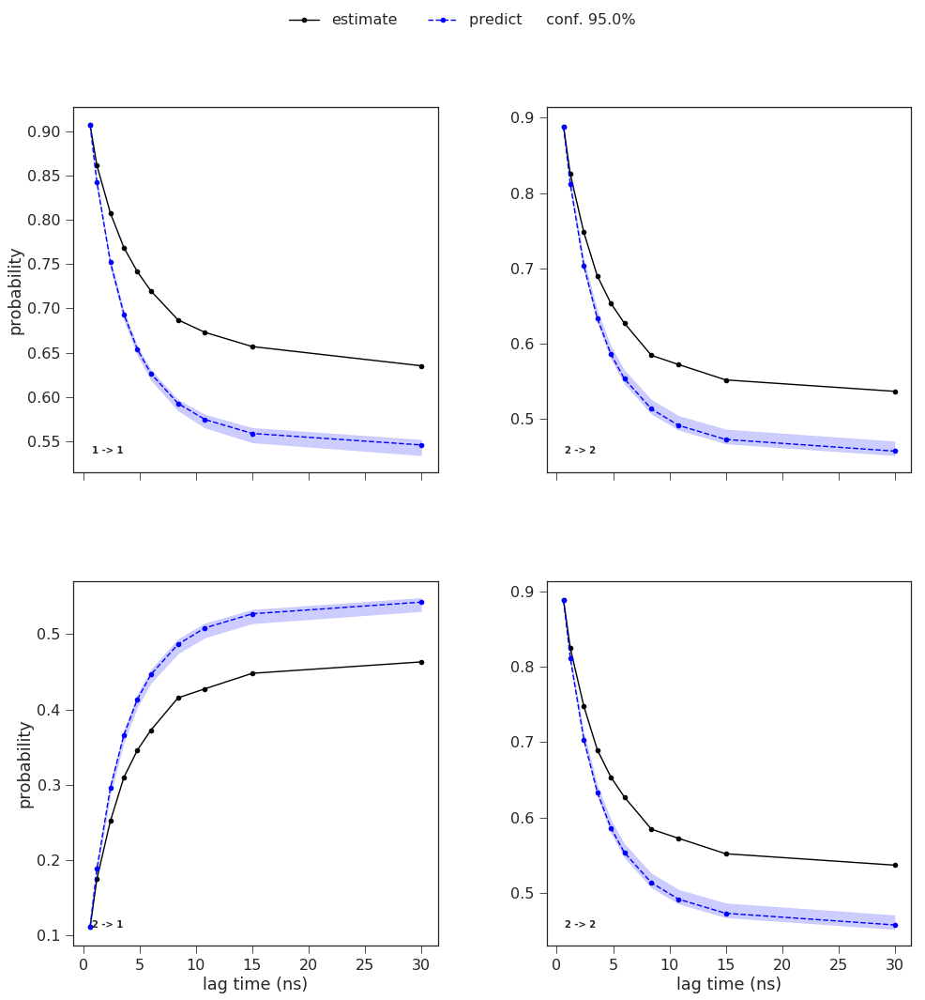

In [169]:
mplt.plot_cktest(ck_wt, diag=True, figsize=(16,16), layout=(2,2), padding_top=0.1, y01=False, padding_between=0.3, dt=0.002, units='ns', Marker='o')

## S99T Coarse graining manual

In [170]:
# dihe= chi1F113, chi1R55, chi1M61, chi1S99, chi13R55, chi2M61, chi1Cys115, chi1Ile97, chi1L98, chi1Q63, chi2L98, chi2Q63
per_state_chi1F113_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 0)
per_state_chi1R55_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 1)
per_state_chi1M61_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 2)
per_state_chi1S99_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 3)
per_state_chi3R55_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 4)
per_state_chi2M61_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 5)
per_state_chi1C115_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 6)
per_state_chi1I97_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 7)
per_state_chi1L98_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 8)
per_state_chi1Q63_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 9)
per_state_chi2L98_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 10)
per_state_chi2Q63_s99t = get_per_state_dihedrals(data_S99T, dihedral_S99T, 11)

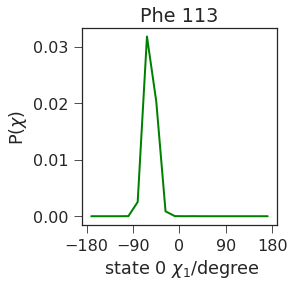

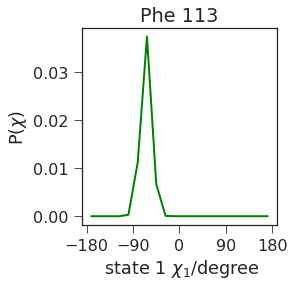

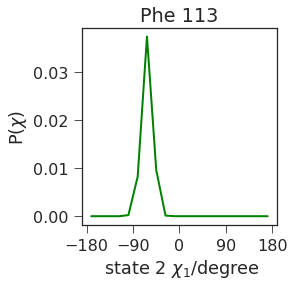

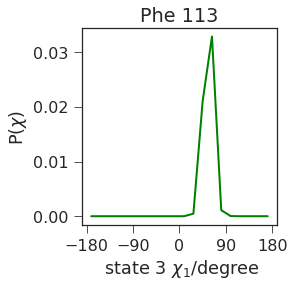

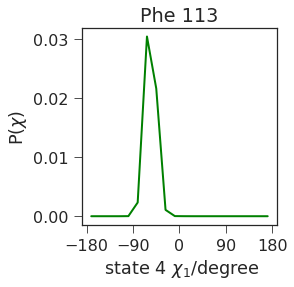

...

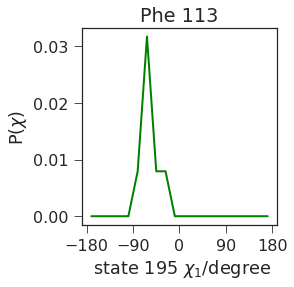

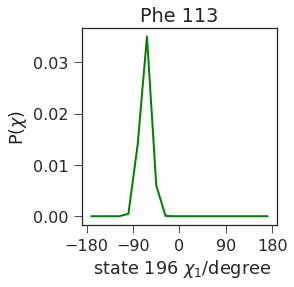

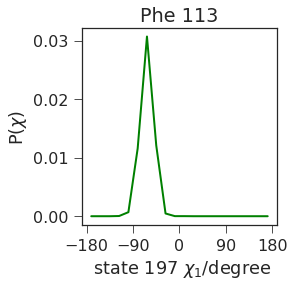

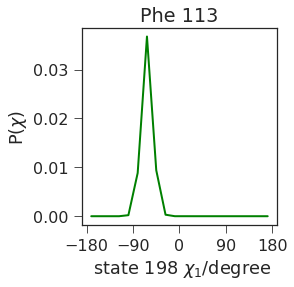

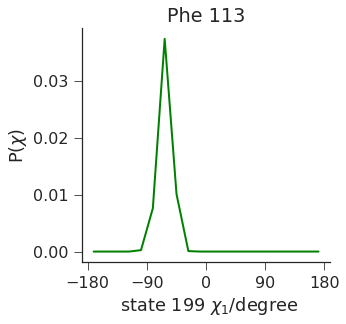

In [171]:
p1_list_s99t =[]
p2_list_s99t = []
for x in range(200):
    state = [x]
    TOT = coarse_grained_states(state,per_state_chi1F113_s99t)
    b,y,p1,p2 = hist_coarse_grained(TOT)
    p1_list_s99t.append(p1)
    p2_list_s99t.append(p2)
    fig = plt.figure(figsize=(16,8))  
    ax = fig.add_subplot(2, 4, 1)
    ax.plot(b,y, '-', color='green', lw=2)
    ax.set_xticks([-180,-90,0,90,180])
    ax.set_xlabel(r' state %s $\chi_1$/degree'% x)
    ax.set_title('Phe 113')
    ax.set_ylabel(r'P($\chi$)')

plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


In [172]:
manual_membership_s99t = []
for i in range(len(p1_list_s99t)):
    if not math.isnan(p1_list_s99t[i]):
        norm = p1_list_s99t[i]+p2_list_s99t[i]
        mem = np.array([p1_list_s99t[i]/norm, p2_list_s99t[i]/norm])
        manual_membership_s99t.append(mem)
manual_membership_s99t = np.array(manual_membership_s99t)

In [173]:
#run ck test with manual memberships
ck_s99t = M_S99T.cktest(2, memberships=manual_membership_s99t,mlags=[1,2,4,6,8,10,14,18,25,50])


HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=10), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

(<matplotlib.figure.Figure at 0x7f2bbc79e410>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f2bbafa8090>,
         <matplotlib.axes._subplots.AxesSubplot object at 0x7f2bb93028d0>]], dtype=object))

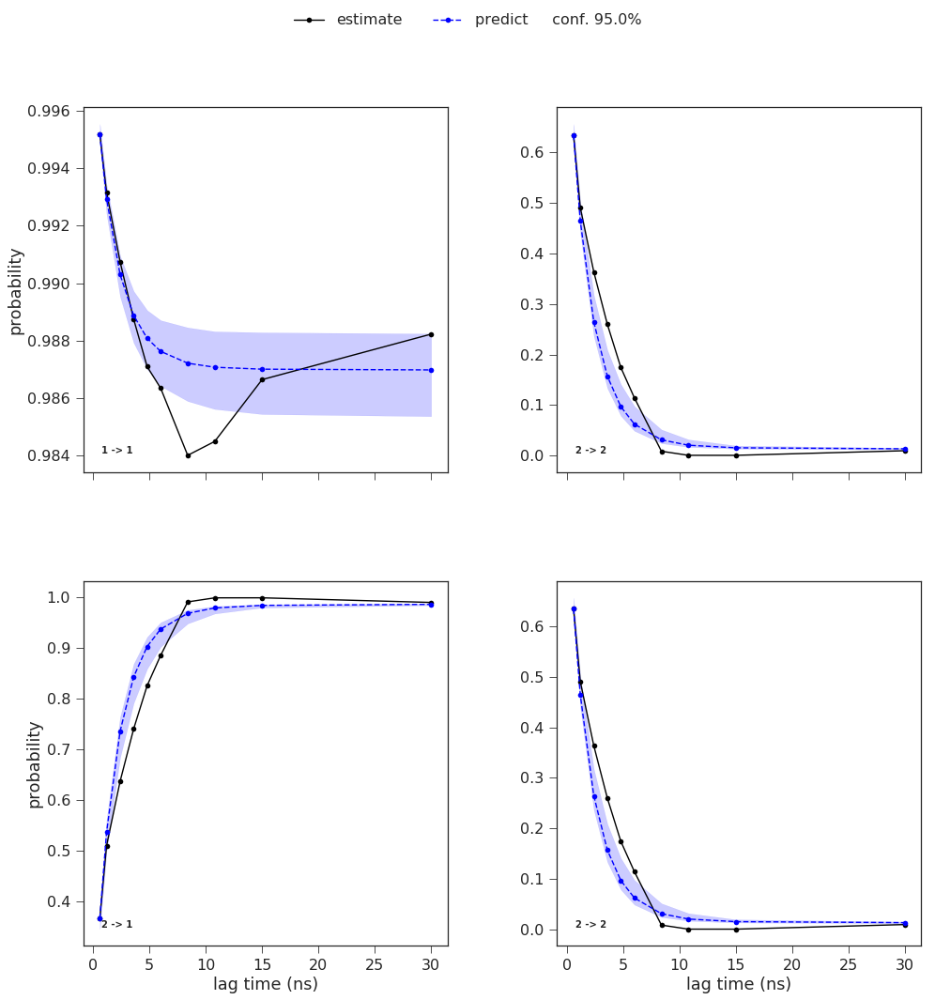

In [174]:
mplt.plot_cktest(ck_s99t, diag=True, figsize=(16,16), layout=(2,2), padding_top=0.1, y01=False, padding_between=0.3, dt=0.002, units='ns', Marker='o')

## S99TCS

In [175]:
# dihe= chi1F113, chi1R55, chi1M61, chi1S99, chi13R55, chi2M61, chi1Cys115, chi1Ile97, chi1L98, chi1Q63, chi2L98, chi2Q63
per_state_chi1F113_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 0)
per_state_chi1R55_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 1)
per_state_chi1M61_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 2)
per_state_chi1S99_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 3)
per_state_chi3R55_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 4)
per_state_chi2M61_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 5)
per_state_chi1C115_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 6)
per_state_chi1I97_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 7)
per_state_chi1L98_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 8)
per_state_chi1Q63_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 9)
per_state_chi2L98_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 10)
per_state_chi2Q63_s99tcs = get_per_state_dihedrals(data_S99TCS, dihedral_S99TCS, 11)

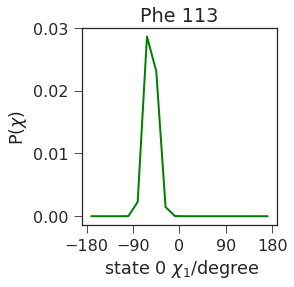

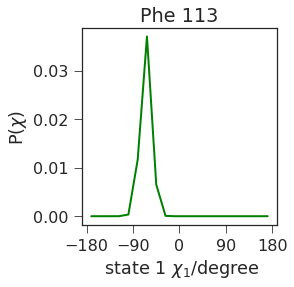

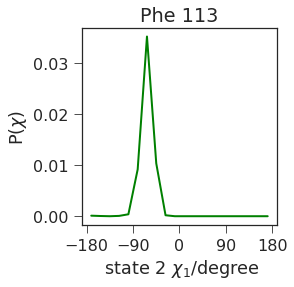

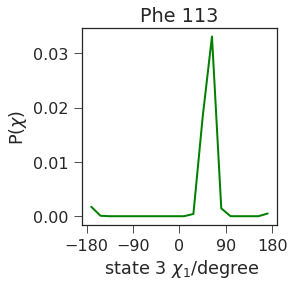

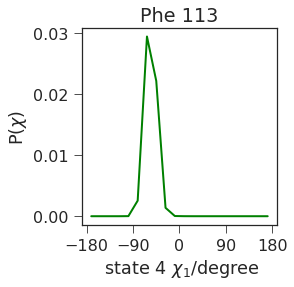

...

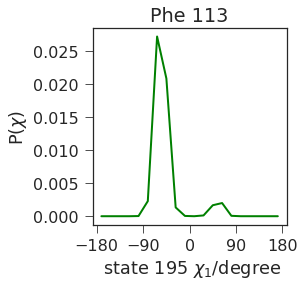

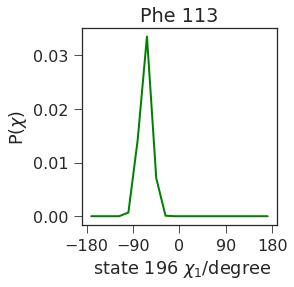

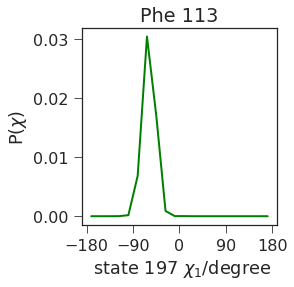

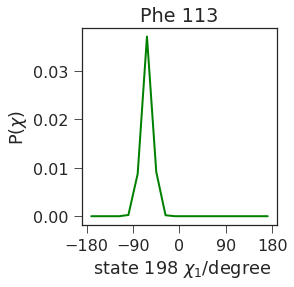

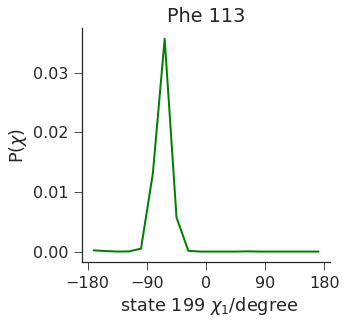

In [176]:
p1_list_s99tcs =[]
p2_list_s99tcs = []
for x in range(200):
    state = [x]
    TOT = coarse_grained_states(state,per_state_chi1F113_s99tcs)
    b,y,p1,p2 = hist_coarse_grained(TOT)
    p1_list_s99tcs.append(p1)
    p2_list_s99tcs.append(p2)
    fig = plt.figure(figsize=(16,8))  
    ax = fig.add_subplot(2, 4, 1)
    ax.plot(b,y, '-', color='green', lw=2)
    ax.set_xticks([-180,-90,0,90,180])
    ax.set_xlabel(r' state %s $\chi_1$/degree'% x)
    ax.set_title('Phe 113')
    ax.set_ylabel(r'P($\chi$)')

plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


In [177]:
manual_membership_s99tcs = []
for i in range(len(p1_list_s99tcs)):
    if not math.isnan(p1_list_s99tcs[i]):
        norm = p1_list_s99tcs[i]+p2_list_s99tcs[i]
        mem = np.array([p1_list_s99tcs[i]/norm, p2_list_s99tcs[i]/norm])
        manual_membership_s99tcs.append(mem)
manual_membership_s99tcs = np.array(manual_membership_s99tcs)

In [178]:
#run ck test with manual memberships
ck_s99tcs = M_S99TCS.cktest(2, memberships=manual_membership_s99tcs,mlags=[1,2,4,6,8,10,14,18,25,50])


HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=10), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

(<matplotlib.figure.Figure at 0x7f2be2820bd0>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f2be244f950>,
         <matplotlib.axes._subplots.AxesSubplot object at 0x7f2be2bc4810>]], dtype=object))

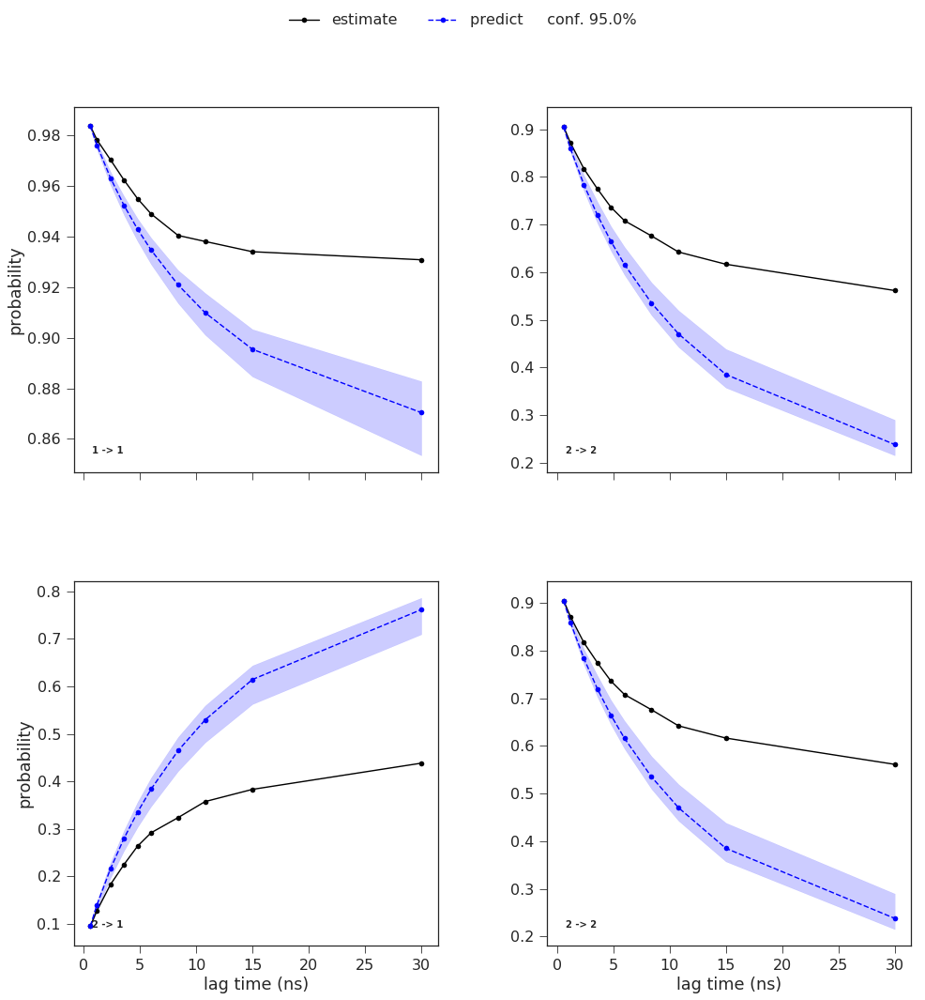

In [179]:
mplt.plot_cktest(ck_s99tcs, diag=True, figsize=(16,16), layout=(2,2), padding_top=0.1, y01=False, padding_between=0.3, dt=0.002, units='ns', Marker='o')

## S99TCSIV

In [180]:
# dihe= chi1F113, chi1R55, chi1M61, chi1S99, chi13R55, chi2M61, chi1Cys115, chi1Ile97, chi1L98, chi1Q63, chi2L98, chi2Q63
per_state_chi1F113_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 0)
per_state_chi1R55_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 1)
per_state_chi1M61_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 2)
per_state_chi1S99_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 3)
per_state_chi3R55_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 4)
per_state_chi2M61_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 5)
per_state_chi1C115_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 6)
per_state_chi1I97_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 7)
per_state_chi1L98_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 8)
per_state_chi1Q63_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 9)
per_state_chi2L98_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 10)
per_state_chi2Q63_s99tcsiv = get_per_state_dihedrals(data_S99TCSIV, dihedral_S99TCSIV, 11)

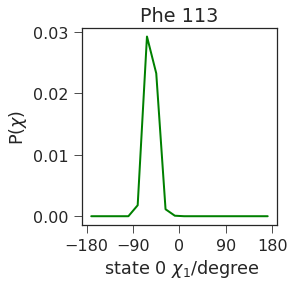

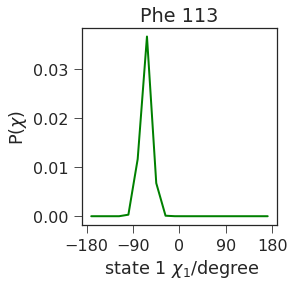

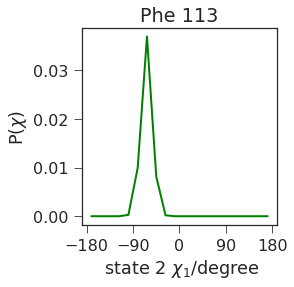

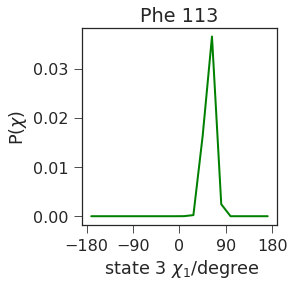

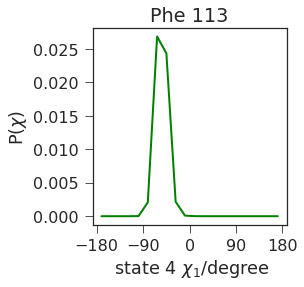

...

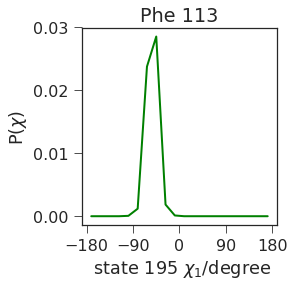

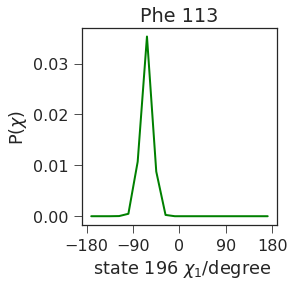

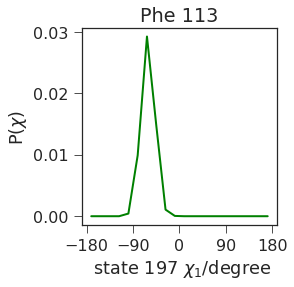

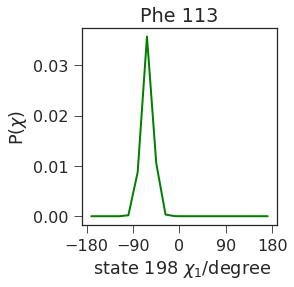

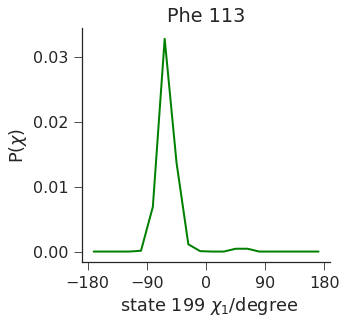

In [181]:
p1_list_s99tcsiv =[]
p2_list_s99tcsiv = []
for x in range(200):
    state = [x]
    TOT = coarse_grained_states(state,per_state_chi1F113_s99tcsiv)
    b,y,p1,p2 = hist_coarse_grained(TOT)
    p1_list_s99tcsiv.append(p1)
    p2_list_s99tcsiv.append(p2)
    fig = plt.figure(figsize=(16,8))  
    ax = fig.add_subplot(2, 4, 1)
    ax.plot(b,y, '-', color='green', lw=2)
    ax.set_xticks([-180,-90,0,90,180])
    ax.set_xlabel(r' state %s $\chi_1$/degree'% x)
    ax.set_title('Phe 113')
    ax.set_ylabel(r'P($\chi$)')

plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

In [182]:
manual_membership_s99tcsiv = []
for i in range(len(p1_list_s99tcsiv)):
    if not math.isnan(p1_list_s99tcsiv[i]):
        norm = p1_list_s99tcsiv[i]+p2_list_s99tcsiv[i]
        mem = np.array([p1_list_s99tcsiv[i]/norm, p2_list_s99tcsiv[i]/norm])
        manual_membership_s99tcsiv.append(mem)
manual_membership_s99tcsiv = np.array(manual_membership_s99tcsiv)

In [183]:
#run ck test with manual memberships
ck_s99tcsiv = M_S99TCSIV.cktest(2, memberships=manual_membership_s99tcsiv,mlags=[1,2,4,6,8,10,14,18,25,50])


HBox(children=(HBox(children=(Label(value=u'estimating BayesianMSM'),), layout=Layout(max_width=u'35%', min_width=u'35%')), HBox(children=(IntProgress(value=0, max=10), HTML(value=u'')), layout=Layout(padding=u'0 0 0 20px'))), layout=Layout(display=u'flex', width=u'100%'))

(<matplotlib.figure.Figure at 0x7f2bb0196850>,
 array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f2bb0901bd0>,
         <matplotlib.axes._subplots.AxesSubplot object at 0x7f2bafdcab50>]], dtype=object))

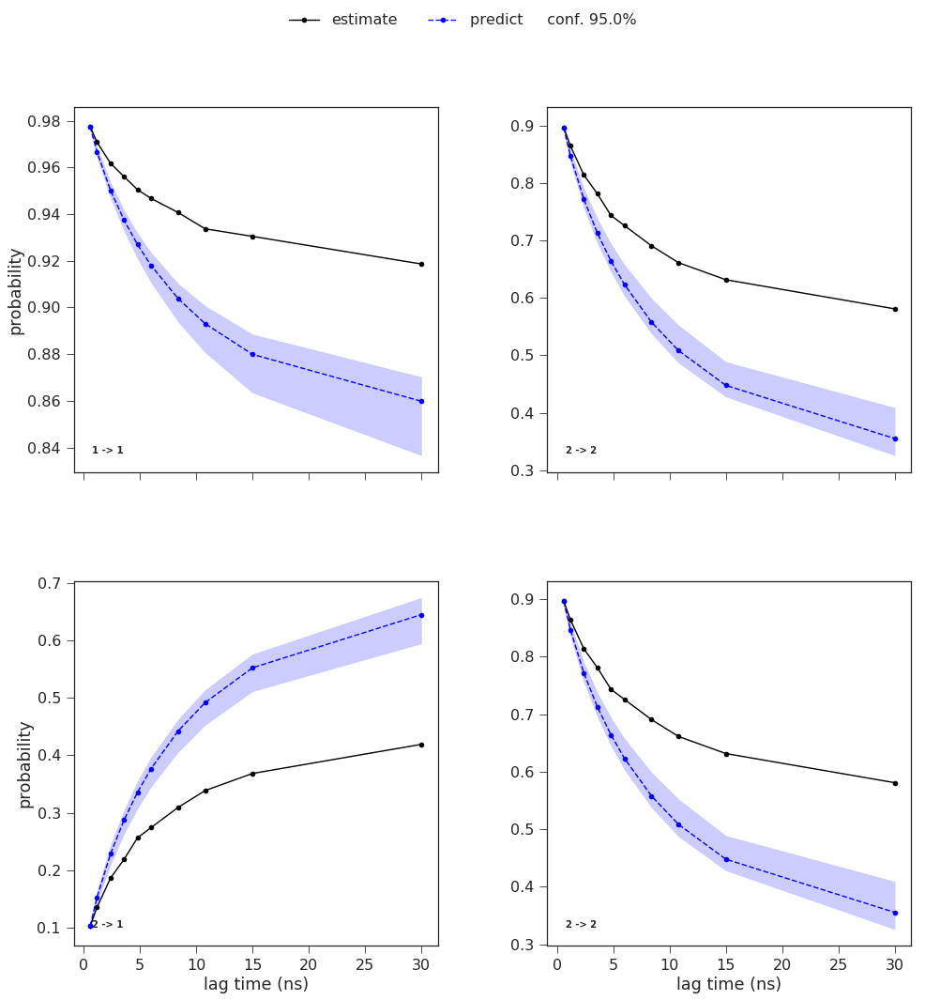

In [184]:
mplt.plot_cktest(ck_s99tcsiv, diag=True, figsize=(16,16), layout=(2,2), padding_top=0.1, y01=False, padding_between=0.3, dt=0.002, units='ns', Marker='o')

In [185]:
# Write out manual memberships
np.savetxt('membership/manual_membership_wt', manual_membership)
np.savetxt('membership/active_set_wt', M_WT.active_set,fmt='%d')

np.savetxt('membership/manual_membership_s99t', manual_membership_s99t)
np.savetxt('membership/active_set_s99t', M_S99T.active_set,fmt='%d')

np.savetxt('membership/manual_membership_s99tcs', manual_membership_s99tcs)
np.savetxt('membership/active_set_s99tcs', M_S99TCS.active_set,fmt='%d')

np.savetxt('membership/manual_membership_s99tcsiv', manual_membership_s99tcsiv)
np.savetxt('membership/active_set_s99tcsiv', M_S99TCSIV.active_set,fmt='%d')


In [186]:
pop_WT = M_WT.pi
pop_S99T =M_S99T.pi
pop_S99TCS =M_S99TCS.pi
pop_S99TCSIV = M_S99TCSIV.pi

np.savetxt('membership/stationary_distribution_wt', pop_WT)
np.savetxt('membership/stationary_distribution_s99t', pop_S99T)
np.savetxt('membership/stationary_distribution_s99tcs', pop_S99TCS)
np.savetxt('membership/stationary_distribution_s99tcsiv', pop_S99TCSIV)

## manual state assignment


## WT

In [1]:
M_WT.sample_std('stationary_distribution')

NameError: name 'manual_membership' is not defined

In [187]:
#calculate the population of macrostate 0 and macrostate 1
pop_Mstate0 = 0.0
pop_Mstate1 = 0.0
assign_Mstate0 = []
assign_Mstate1 = []
index_M0=[]
index_M1=[]
for i in range(len(manual_membership)):
    prob_set0 = manual_membership[i][0]
    prob_set1 = manual_membership[i][1]
    state_num =  M_WT.active_set[i]
    pop = pop_WT[i]
    if (prob_set0>prob_set1):
        assign_Mstate0.append(state_num)
        index_M0.append(i)
        pop_Mstate0+=pop
    else:
        assign_Mstate1.append(state_num)
        index_M1.append(i)
        pop_Mstate1+=pop
print 'Population of macrostate 0 is %.4f'%(pop_Mstate0)
print 'Population of macrostate 1 is %4f'%(pop_Mstate1)

Population of macrostate 0 is 0.5480
Population of macrostate 1 is 0.452010


In [188]:
#calculate mean first passage time


mean_sam, std_sam = mfpt(M_WT, index_M0, index_M1)
print 'Mean first passage time between set0 and set1 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)
mean_sam, std_sam = mfpt(M_WT, index_M1, index_M0)
print 'Mean first passage time between set1 and set0 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)

Mean first passage time between set0 and set1 is 15.2203 ± 0.1569 ns
Mean first passage time between set1 and set0 is 12.6161 ± 0.3110 ns


In [253]:
print assign_Mstate0
np.savetxt('membership/Mstate0_wt', assign_Mstate0,fmt='%d')
print assign_Mstate1
np.savetxt('membership/Mstate1_wt', assign_Mstate1,fmt='%d')

[0, 1, 2, 4, 6, 7, 9, 11, 12, 13, 14, 17, 19, 20, 21, 22, 23, 26, 27, 29, 32, 35, 36, 37, 41, 43, 45, 47, 48, 49, 50, 52, 53, 55, 57, 59, 62, 63, 64, 65, 67, 71, 72, 74, 80, 81, 82, 83, 84, 86, 89, 92, 93, 95, 96, 97, 99, 100, 101, 107, 109, 110, 111, 114, 115, 117, 119, 122, 125, 126, 133, 136, 137, 142, 144, 146, 149, 152, 153, 156, 159, 160, 164, 170, 171, 174, 175, 176, 178, 179, 181, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 196, 197, 198, 199]
[3, 10, 18, 24, 25, 30, 31, 33, 38, 40, 42, 44, 46, 54, 60, 69, 70, 73, 75, 76, 77, 78, 79, 87, 88, 90, 94, 98, 102, 103, 104, 105, 106, 108, 112, 113, 120, 121, 123, 124, 127, 128, 129, 130, 132, 134, 135, 140, 141, 143, 147, 150, 155, 157, 158, 161, 162, 163, 165, 166, 167, 168, 169, 173, 182, 183]


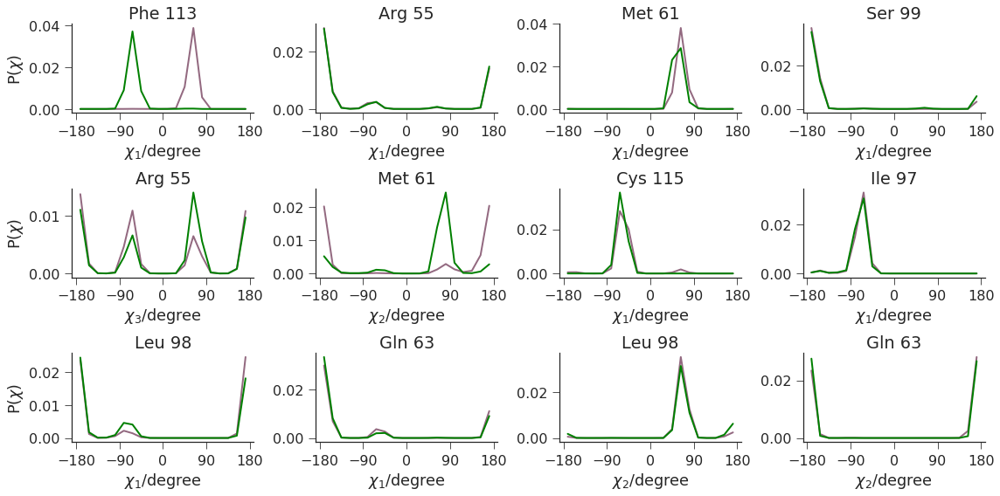

In [189]:
fig = plt.figure(figsize=(16,8))  
A = coarse_grained_states(assign_Mstate0,per_state_chi1F113_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1F113_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 1)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Phe 113')
ax.set_ylabel(r'P($\chi$)')
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_Mstate0,per_state_chi1R55_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1R55_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 2)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Arg 55')

A = coarse_grained_states(assign_Mstate0,per_state_chi1M61_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1M61_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 3)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_Mstate0,per_state_chi1S99_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1S99_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 4)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Ser 99')

A = coarse_grained_states(assign_Mstate0,per_state_chi3R55_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi3R55_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 5)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_3$/degree')
ax.set_title('Arg 55')
ax.set_ylabel(r'P($\chi$)')

A = coarse_grained_states(assign_Mstate0,per_state_chi2M61_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi2M61_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 6)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_Mstate0,per_state_chi1C115_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1C115_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 7)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Cys 115')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_Mstate0,per_state_chi1I97_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1I97_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 8)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Ile 97')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_Mstate0,per_state_chi1L98_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1L98_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 9)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_ylabel(r'P($\chi$)')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_Mstate0,per_state_chi1Q63_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi1Q63_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 10)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_Mstate0,per_state_chi2L98_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi2L98_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 11)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


A = coarse_grained_states(assign_Mstate0,per_state_chi2Q63_wt)
B = coarse_grained_states(assign_Mstate1,per_state_chi2Q63_wt)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 12)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()



## S99T

In [190]:
#calculate the population of macrostate 0 and macrostate 1
pop_M0_s99t = 0.0
pop_M1_s99t = 0.0
assign_M0_s99t = []
assign_M1_s99t = []
index_M0_s99t=[]
index_M1_s99t=[]
for i in range(len(manual_membership_s99t)):
    prob_set0 = manual_membership_s99t[i][0]
    prob_set1 = manual_membership_s99t[i][1]
    state_num =  M_S99T.active_set[i]
    pop = pop_S99T[i]
    if (prob_set0>prob_set1):
        assign_M0_s99t.append(state_num)
        index_M0_s99t.append(i)
        pop_M0_s99t+=pop
    else:
        assign_M1_s99t.append(state_num)
        index_M1_s99t.append(i)
        pop_M1_s99t+=pop
print 'Population of macrostate 0 is %.4f'%(pop_M0_s99t)
print 'Population of macrostate 1 is %4f'%(pop_M1_s99t)

Population of macrostate 0 is 0.9871
Population of macrostate 1 is 0.012945


In [191]:
#calculate mean first passage time


mean_sam, std_sam = mfpt(M_S99T, index_M0_s99t, index_M1_s99t)
print 'Mean first passage time between set0 and set1 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)
mean_sam, std_sam = mfpt(M_S99T, index_M1_s99t, index_M0_s99t)
print 'Mean first passage time between set1 and set0 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)

Mean first passage time between set0 and set1 is 263.8581 ± 10.3041 ns
Mean first passage time between set1 and set0 is 4.2594 ± 0.3210 ns


In [254]:
print assign_M0_s99t
np.savetxt('membership/Mstate0_s99t', assign_M0_s99t,fmt='%d')
print assign_M1_s99t
np.savetxt('membership/Mstate1_s99t', assign_M1_s99t,fmt='%d')

[0, 1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 17, 19, 20, 21, 22, 23, 26, 27, 29, 31, 32, 35, 36, 37, 41, 43, 45, 47, 48, 49, 50, 52, 53, 55, 57, 59, 60, 63, 64, 66, 67, 71, 72, 74, 77, 79, 81, 82, 83, 84, 86, 89, 92, 93, 96, 99, 100, 101, 106, 107, 109, 110, 111, 114, 115, 117, 119, 120, 122, 123, 124, 125, 126, 133, 134, 135, 136, 137, 139, 142, 143, 144, 146, 149, 151, 152, 153, 156, 158, 159, 160, 164, 167, 170, 171, 174, 175, 176, 178, 179, 181, 184, 185, 186, 188, 189, 190, 191, 192, 193, 195, 196, 197, 198, 199]
[3, 18, 25, 30, 33, 44, 46, 69, 70, 73, 90, 94, 103, 121, 130, 147, 162, 163, 166, 168, 182]


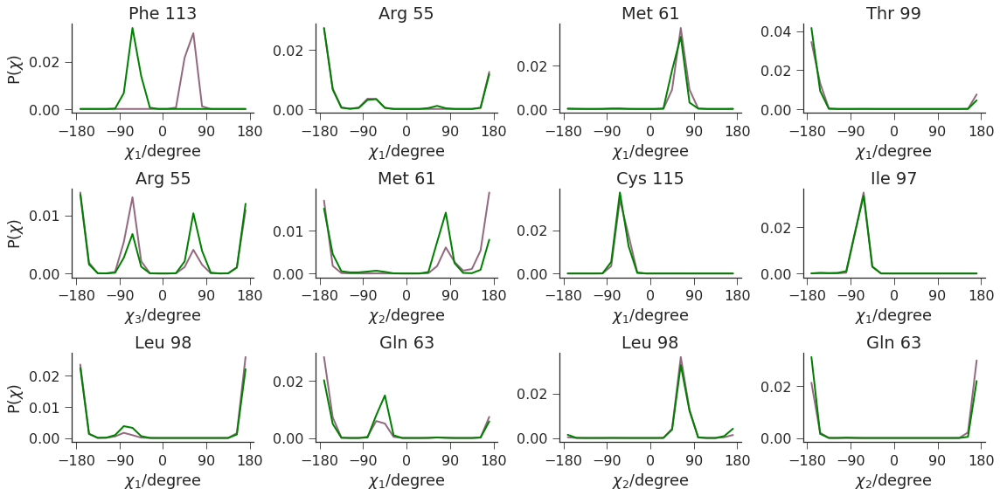

In [196]:
fig = plt.figure(figsize=(16,8))  
A = coarse_grained_states(assign_M0_s99t,per_state_chi1F113_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1F113_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 1)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Phe 113')
ax.set_ylabel(r'P($\chi$)')
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99t,per_state_chi1R55_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1R55_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 2)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Arg 55')

A = coarse_grained_states(assign_M0_s99t,per_state_chi1M61_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1M61_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 3)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_M0_s99t,per_state_chi1S99_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1S99_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 4)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Thr 99')

A = coarse_grained_states(assign_M0_s99t,per_state_chi3R55_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi3R55_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 5)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_3$/degree')
ax.set_title('Arg 55')
ax.set_ylabel(r'P($\chi$)')

A = coarse_grained_states(assign_M0_s99t,per_state_chi2M61_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi2M61_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 6)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_M0_s99t,per_state_chi1C115_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1C115_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 7)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Cys 115')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99t,per_state_chi1I97_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1I97_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 8)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Ile 97')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99t,per_state_chi1L98_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1L98_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 9)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_ylabel(r'P($\chi$)')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99t,per_state_chi1Q63_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi1Q63_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 10)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99t,per_state_chi2L98_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi2L98_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 11)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


A = coarse_grained_states(assign_M0_s99t,per_state_chi2Q63_s99t)
B = coarse_grained_states(assign_M1_s99t,per_state_chi2Q63_s99t)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 12)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

## S99TCS

In [193]:
#calculate the population of macrostate 0 and macrostate 1
pop_M0_s99tcs = 0.0
pop_M1_s99tcs = 0.0
assign_M0_s99tcs = []
assign_M1_s99tcs = []
index_M0_s99tcs=[]
index_M1_s99tcs=[]
for i in range(len(manual_membership_s99tcs)):
    prob_set0 = manual_membership_s99tcs[i][0]
    prob_set1 = manual_membership_s99tcs[i][1]
    state_num =  M_S99TCS.active_set[i]
    pop = pop_S99TCS[i]
    if (prob_set0>prob_set1):
        assign_M0_s99tcs.append(state_num)
        index_M0_s99tcs.append(i)
        pop_M0_s99tcs+=pop
    else:
        assign_M1_s99tcs.append(state_num)
        index_M1_s99tcs.append(i)
        pop_M1_s99tcs+=pop
print 'Population of macrostate 0 is %.4f'%(pop_M0_s99tcs)
print 'Population of macrostate 1 is %4f'%(pop_M1_s99tcs)

Population of macrostate 0 is 0.8556
Population of macrostate 1 is 0.144423


In [194]:
#calculate mean first passage time


mean_sam, std_sam = mfpt(M_S99TCS, index_M0_s99tcs, index_M1_s99tcs)
print 'Mean first passage time between set0 and set1 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)
mean_sam, std_sam = mfpt(M_S99TCS, index_M1_s99tcs, index_M0_s99tcs)
print 'Mean first passage time between set1 and set0 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)

Mean first passage time between set0 and set1 is 137.3928 ± 5.3243 ns
Mean first passage time between set1 and set0 is 25.4920 ± 2.3536 ns


In [255]:
print assign_M0_s99tcs
np.savetxt('membership/Mstate0_s99tcs', assign_M0_s99tcs,fmt='%d')
print assign_M1_s99tcs
np.savetxt('membership/Mstate1_s99tcs', assign_M1_s99tcs,fmt='%d')

[0, 1, 2, 4, 5, 6, 7, 9, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 26, 27, 29, 31, 32, 34, 35, 36, 37, 39, 41, 43, 45, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 67, 71, 72, 74, 77, 80, 81, 82, 83, 84, 86, 89, 91, 92, 93, 96, 97, 98, 99, 100, 101, 104, 106, 107, 109, 110, 111, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 128, 129, 131, 133, 134, 135, 136, 137, 138, 139, 141, 142, 143, 144, 145, 146, 148, 149, 151, 152, 153, 154, 156, 158, 159, 160, 164, 170, 171, 172, 174, 175, 176, 177, 178, 179, 180, 181, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199]
[3, 10, 18, 24, 25, 28, 30, 33, 38, 40, 42, 44, 46, 54, 69, 70, 73, 75, 76, 78, 79, 85, 87, 88, 90, 94, 95, 102, 103, 105, 108, 112, 113, 121, 127, 130, 132, 140, 147, 150, 155, 157, 161, 162, 163, 165, 166, 167, 168, 169, 173, 182, 183]


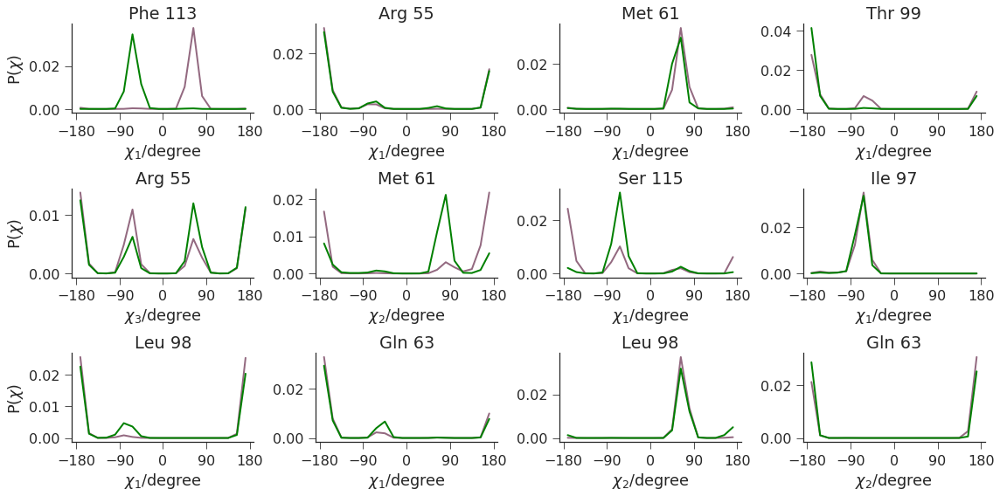

In [197]:
fig = plt.figure(figsize=(16,8))  
A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1F113_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1F113_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 1)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Phe 113')
ax.set_ylabel(r'P($\chi$)')
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1R55_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1R55_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 2)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Arg 55')

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1M61_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1M61_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 3)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1S99_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1S99_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 4)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Thr 99')

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi3R55_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi3R55_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 5)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_3$/degree')
ax.set_title('Arg 55')
ax.set_ylabel(r'P($\chi$)')

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi2M61_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi2M61_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 6)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1C115_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1C115_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 7)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Ser 115')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1I97_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1I97_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 8)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Ile 97')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1L98_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1L98_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 9)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_ylabel(r'P($\chi$)')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi1Q63_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi1Q63_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 10)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcs,per_state_chi2L98_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi2L98_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 11)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


A = coarse_grained_states(assign_M0_s99tcs,per_state_chi2Q63_s99tcs)
B = coarse_grained_states(assign_M1_s99tcs,per_state_chi2Q63_s99tcs)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 12)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

## S99TCSIV

In [198]:
#calculate the population of macrostate 0 and macrostate 1
pop_M0_s99tcsiv = 0.0
pop_M1_s99tcsiv = 0.0
assign_M0_s99tcsiv = []
assign_M1_s99tcsiv = []
index_M0_s99tcsiv=[]
index_M1_s99tcsiv=[]
for i in range(len(manual_membership_s99tcsiv)):
    prob_set0 = manual_membership_s99tcsiv[i][0]
    prob_set1 = manual_membership_s99tcsiv[i][1]
    state_num =  M_S99TCSIV.active_set[i]
    pop = pop_S99TCSIV[i]
    if (prob_set0>prob_set1):
        assign_M0_s99tcsiv.append(state_num)
        index_M0_s99tcsiv.append(i)
        pop_M0_s99tcsiv+=pop
    else:
        assign_M1_s99tcsiv.append(state_num)
        index_M1_s99tcsiv.append(i)
        pop_M1_s99tcsiv+=pop
print 'Population of macrostate 0 is %.4f'%(pop_M0_s99tcsiv)
print 'Population of macrostate 1 is %4f'%(pop_M1_s99tcsiv)

Population of macrostate 0 is 0.8238
Population of macrostate 1 is 0.176161


In [199]:
#calculate mean first passage time


mean_sam, std_sam = mfpt(M_S99TCSIV, index_M0_s99tcsiv, index_M1_s99tcsiv)
print 'Mean first passage time between set0 and set1 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)
mean_sam, std_sam = mfpt(M_S99TCSIV, index_M1_s99tcsiv, index_M0_s99tcsiv)
print 'Mean first passage time between set1 and set0 is %.4f ± %.4f ns'%(mean_sam*0.002, std_sam*0.002)

Mean first passage time between set0 and set1 is 105.5655 ± 5.4718 ns
Mean first passage time between set1 and set0 is 21.0373 ± 2.1667 ns


In [256]:
print assign_M0_s99tcsiv
np.savetxt('membership/Mstate0_s99tcsiv', assign_M0_s99tcsiv,fmt='%d')
print assign_M1_s99tcsiv
np.savetxt('membership/Mstate1_s99tcsiv', assign_M1_s99tcsiv,fmt='%d')

[0, 1, 2, 4, 5, 6, 7, 8, 9, 11, 12, 13, 14, 15, 16, 17, 19, 20, 21, 22, 23, 26, 27, 29, 31, 32, 35, 36, 37, 39, 41, 43, 45, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 71, 72, 74, 77, 80, 81, 82, 83, 84, 86, 89, 91, 92, 93, 96, 97, 98, 99, 100, 101, 104, 106, 107, 109, 110, 111, 114, 115, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 128, 129, 131, 133, 134, 135, 136, 137, 138, 139, 141, 142, 143, 144, 145, 146, 148, 149, 151, 152, 153, 156, 158, 159, 160, 164, 170, 171, 172, 174, 175, 176, 177, 178, 179, 180, 181, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199]
[3, 10, 18, 24, 25, 28, 30, 33, 38, 40, 42, 44, 46, 54, 69, 70, 73, 75, 76, 78, 79, 85, 87, 88, 90, 94, 95, 102, 103, 105, 108, 112, 113, 121, 127, 130, 132, 140, 147, 150, 154, 155, 157, 161, 162, 163, 165, 166, 167, 168, 169, 182, 183, 184]


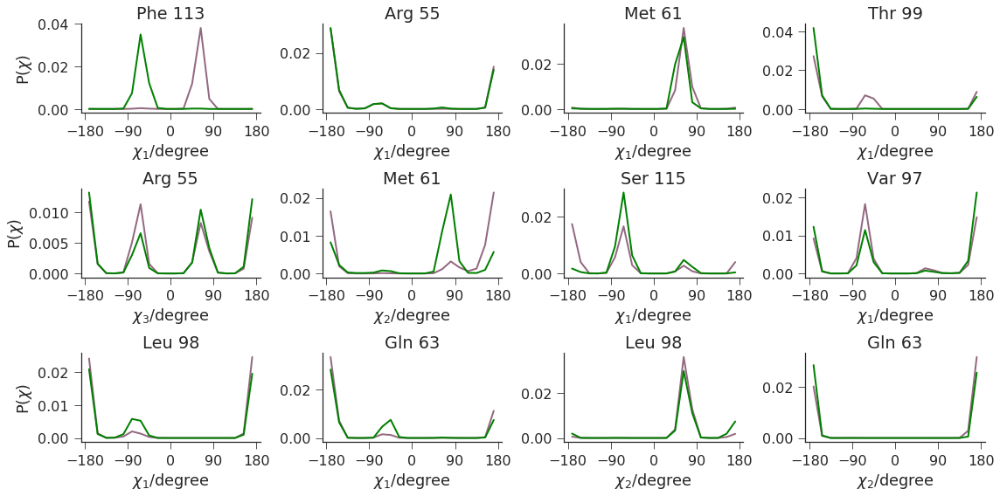

In [200]:
fig = plt.figure(figsize=(16,8))  
A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1F113_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1F113_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 1)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Phe 113')
ax.set_ylabel(r'P($\chi$)')
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1R55_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1R55_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 2)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Arg 55')

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1M61_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1M61_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 3)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1S99_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1S99_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 4)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_title('Thr 99')

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi3R55_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi3R55_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 5)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_3$/degree')
ax.set_title('Arg 55')
ax.set_ylabel(r'P($\chi$)')

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi2M61_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi2M61_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 6)
ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_xticks([-180,-90,0,90,180])
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_title('Met 61')

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1C115_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1C115_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 7)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Ser 115')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1I97_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1I97_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 8)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Var 97')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1L98_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1L98_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 9)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_ylabel(r'P($\chi$)')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi1Q63_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi1Q63_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 10)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_1$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()

A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi2L98_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi2L98_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 11)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Leu 98')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()


A = coarse_grained_states(assign_M0_s99tcsiv,per_state_chi2Q63_s99tcsiv)
B = coarse_grained_states(assign_M1_s99tcsiv,per_state_chi2Q63_s99tcsiv)
b1,y1,p0,p1 = hist_coarse_grained(A)
b,y,p00,p11 = hist_coarse_grained(B)
ax = fig.add_subplot(3, 4, 12)

ax.plot(b,y, '-', color='#936980', lw=2)
ax.plot(b1,y1, '-', color='green', lw=2)
ax.set_title('Gln 63')
ax.set_xlabel(r'$\chi_2$/degree')
ax.set_xticks([-180,-90,0,90,180])
plt.tight_layout()
#ax.legend(loc=3)
sbn.despine()